In [1]:
import pandas as pd

df = pd.read_csv('Pytorch_Community_Scraped_Data_7059posts_new.csv')
df

,Unnamed: 0,Topic Title,Category,Tags,Leading Post,Post Replies,Created_at,Likes,Views,Replies
0,0,About the FAQ category,FAQ,[],The FAQ category contains commonly-asked quest...,[],0,0,0,0
1,1,Vscode debug from python step into c++,FAQ,[],I am using vscode to debug pytorch internals i...,[],0,0,0,0
2,2,Why are my tensor’s gradients unexpectedly Non...,FAQ,[],tl;dr\nEnsure that\n\ntensor.is_leaf == True\n...,[],0,0,0,0
3,3,How to measure execution time in PyTorch?,FAQ,[],tl;dr\nThe recommended profiling methods are:\...,[],0,0,0,0
4,4,Time/Memory keeps increasing at every iteration,FAQ,[],How are you measuring time?\nIf each new itera...,[],0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
7055,7055,RuntimeError due to inplace operation,autograd,[],I’m still trying to wrap my head around PyTorc...,"['The error you had before the present one, na...",2/22/2021 7:12,3,118,5
7056,7056,Gradient of FC with respect to each sample in ...,autograd,[],I want to get gradient of FC layer of network ...,['autograd automatically condenses the gradien...,2/26/2021 13:02,0,75,1
7057,7057,The second order derivative of a function with...,autograd,[],"Hi,\nI have a question about the second order ...","['Hi,\nThe problem is that your function is li...",2/25/2021 23:24,2,100,3
7058,7058,.grad attribute of a non-leaf tensor being acc...,autograd,[],"Hi there, im a newbie at pytorch.\nI am runnin...","['Hi,\nThis warning only means that you are ac...",5/21/2020 8:42,9,6.7k,9


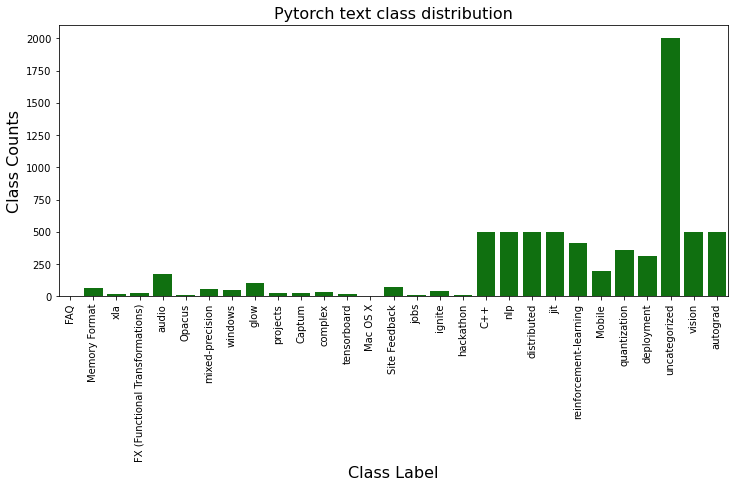

In [2]:
# Data Exploration & Visualisation===========================================
%matplotlib inline

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12,5))
sns.countplot(x = df.Category, color='green')
plt.title('Pytorch text class distribution', fontsize=16)
plt.ylabel('Class Counts', fontsize=16)
plt.xlabel('Class Label', fontsize=16)
plt.xticks(rotation='vertical');

In [3]:
df.drop(columns= ['Unnamed: 0'], inplace=True)

In [4]:
df_1 = df.copy()

In [5]:
df_1['text'] = df_1['Topic Title'] + ' ' + df_1['Leading Post'] + ' ' + df_1['Post Replies']

In [6]:
df_1

,Topic Title,Category,Tags,Leading Post,Post Replies,Created_at,Likes,Views,Replies,text
0,About the FAQ category,FAQ,[],The FAQ category contains commonly-asked quest...,[],0,0,0,0,About the FAQ category The FAQ category contai...
1,Vscode debug from python step into c++,FAQ,[],I am using vscode to debug pytorch internals i...,[],0,0,0,0,Vscode debug from python step into c++ I am us...
2,Why are my tensor’s gradients unexpectedly Non...,FAQ,[],tl;dr\nEnsure that\n\ntensor.is_leaf == True\n...,[],0,0,0,0,Why are my tensor’s gradients unexpectedly Non...
3,How to measure execution time in PyTorch?,FAQ,[],tl;dr\nThe recommended profiling methods are:\...,[],0,0,0,0,How to measure execution time in PyTorch? tl;d...
4,Time/Memory keeps increasing at every iteration,FAQ,[],How are you measuring time?\nIf each new itera...,[],0,0,0,0,Time/Memory keeps increasing at every iteratio...
...,...,...,...,...,...,...,...,...,...,...
7055,RuntimeError due to inplace operation,autograd,[],I’m still trying to wrap my head around PyTorc...,"['The error you had before the present one, na...",2/22/2021 7:12,3,118,5,RuntimeError due to inplace operation I’m stil...
7056,Gradient of FC with respect to each sample in ...,autograd,[],I want to get gradient of FC layer of network ...,['autograd automatically condenses the gradien...,2/26/2021 13:02,0,75,1,Gradient of FC with respect to each sample in ...
7057,The second order derivative of a function with...,autograd,[],"Hi,\nI have a question about the second order ...","['Hi,\nThe problem is that your function is li...",2/25/2021 23:24,2,100,3,The second order derivative of a function with...
7058,.grad attribute of a non-leaf tensor being acc...,autograd,[],"Hi there, im a newbie at pytorch.\nI am runnin...","['Hi,\nThis warning only means that you are ac...",5/21/2020 8:42,9,6.7k,9,.grad attribute of a non-leaf tensor being acc...


In [29]:
from gensim import utils
import gensim.parsing.preprocessing as gsp

filters = [
           gsp.strip_tags, 
           gsp.strip_punctuation,
           gsp.strip_multiple_whitespaces,
           gsp.strip_numeric,
           gsp.remove_stopwords, 
           gsp.strip_short, 
           gsp.stem_text
          ]

def clean_text(s):
    s = str(s)
    s = s.lower()
    s = utils.to_unicode(s)
    for f in filters:
        s = f(s)
    return s

In [30]:
df_1.iloc[2,1]

'FAQ'

In [31]:
clean_text(df_1.iloc[2,1])

'faq'

In [32]:
%matplotlib inline

from wordcloud import WordCloud

def plot_word_cloud(text):
    wordcloud_instance = WordCloud(width = 800, height = 800, 
                background_color ='black', 
                stopwords=None,
                min_font_size = 10).generate(text) 
             
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud_instance) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.show()

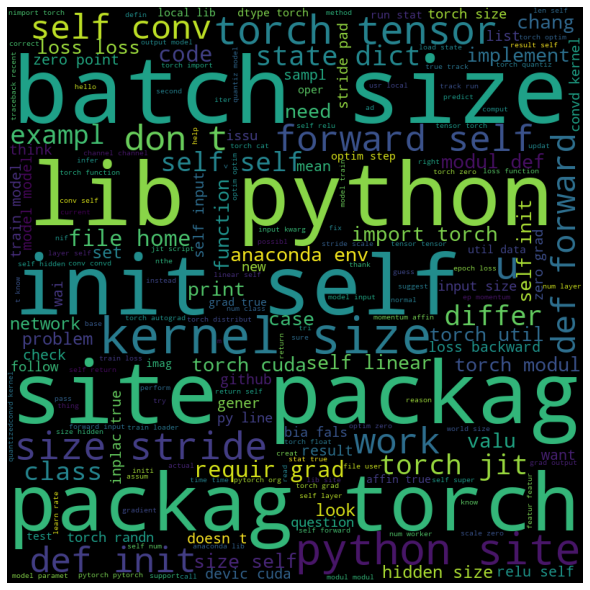

In [33]:
texts = ''
for index, item in df_1.iterrows():
    texts = texts + ' ' + clean_text(item['text'])
    
plot_word_cloud(texts)

In [40]:
df_1.rename(columns={"Category": "category"}, inplace=True)

In [41]:
def plot_word_cloud_for_category(df_1, category):
    text_df = df_1.loc[df_1['category'] == str(category)]
    texts = ''
    for index, item in text_df.iterrows():
        texts = texts + ' ' + clean_text(item['text'])
    
    plot_word_cloud(texts)

In [42]:
df_1.category.unique()

array(['FAQ', 'Memory Format', 'xla', 'FX (Functional Transformations)',
       'audio', 'Opacus', 'mixed-precision', 'windows', nan, 'glow',
       'projects', 'Captum', 'complex', 'tensorboard', 'Mac OS X',
       'Site Feedback', 'jobs', 'ignite', 'hackathon', 'C++', 'nlp',
       'distributed', 'jit', 'reinforcement-learning', 'Mobile',
       'quantization', 'deployment', 'uncategorized', 'vision',
       'autograd'], dtype=object)

In [45]:
my_list = ['FAQ', 'Memory Format', 'xla', 'FX (Functional Transformations)',
       'audio', 'Opacus', 'mixed-precision', 'windows', 'glow',
       'projects', 'Captum', 'complex', 'tensorboard', 'Mac OS X',
       'Site Feedback', 'jobs', 'ignite', 'hackathon', 'C++', 'nlp',
       'distributed', 'jit', 'reinforcement-learning', 'Mobile',
       'quantization', 'deployment', 'uncategorized', 'vision',
       'autograd']

FAQ


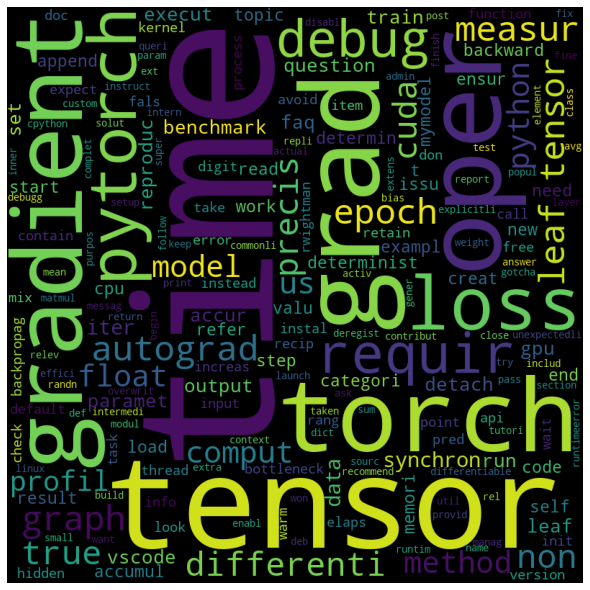

Memory Format


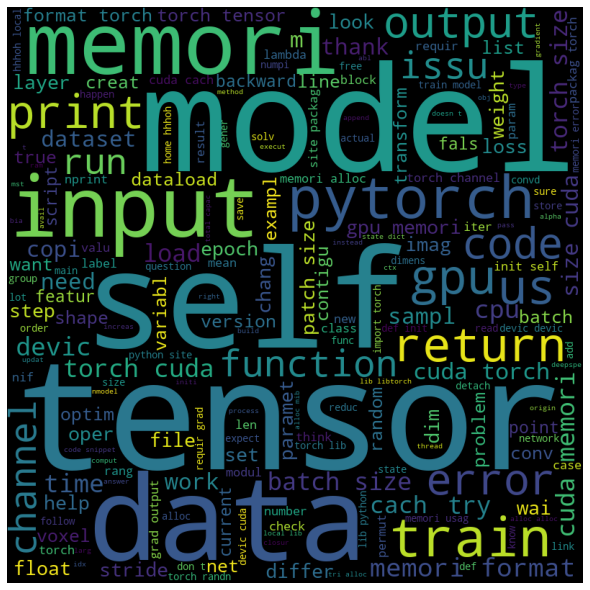

xla


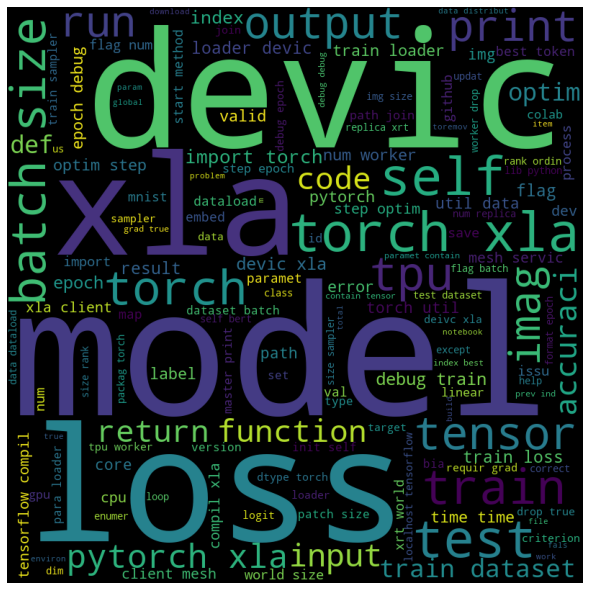

FX (Functional Transformations)


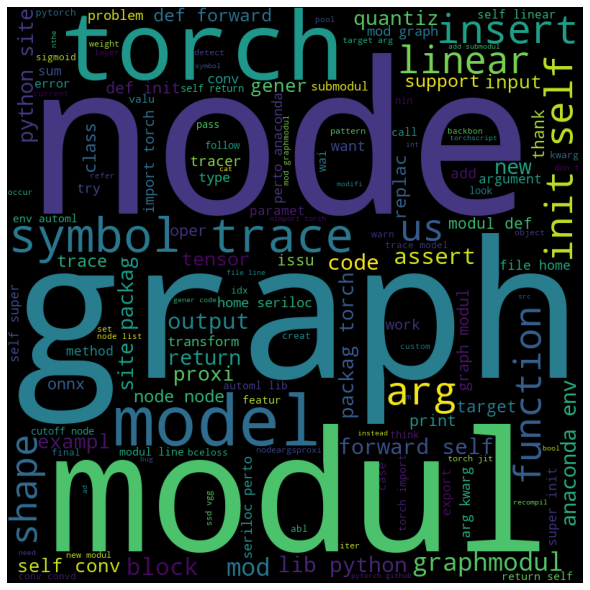

audio


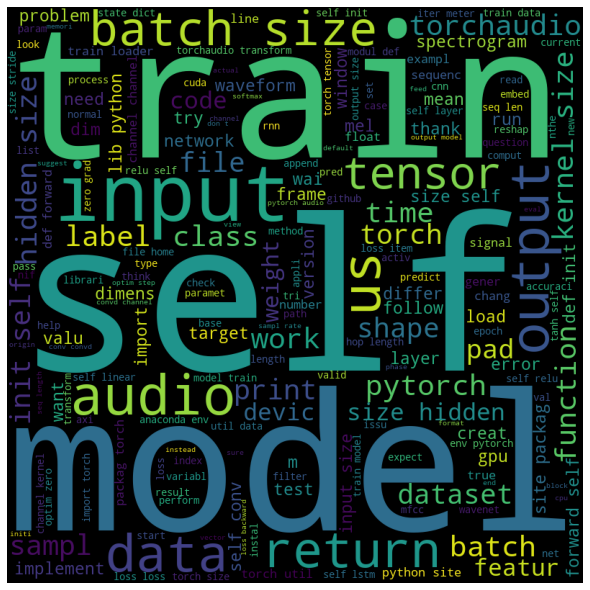

Opacus


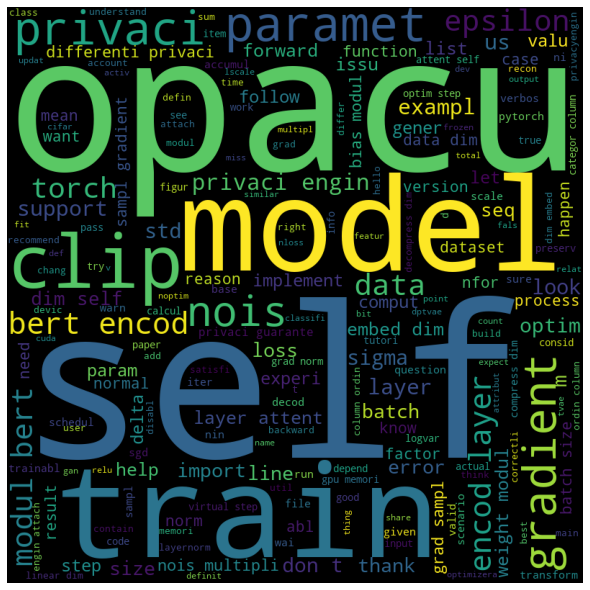

mixed-precision


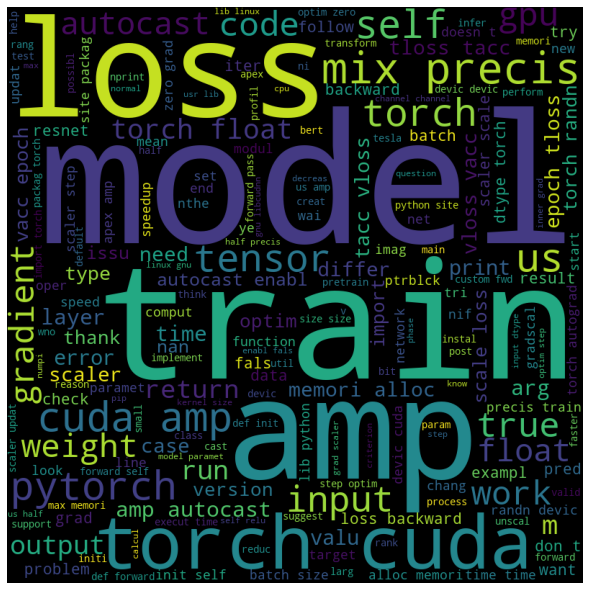

windows


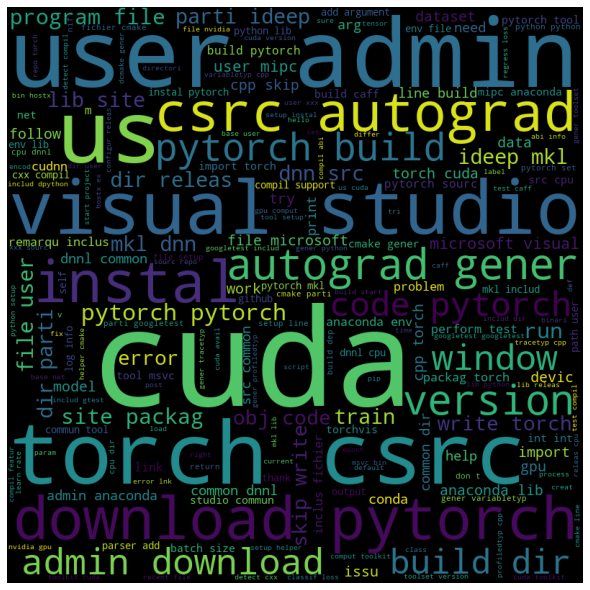

glow


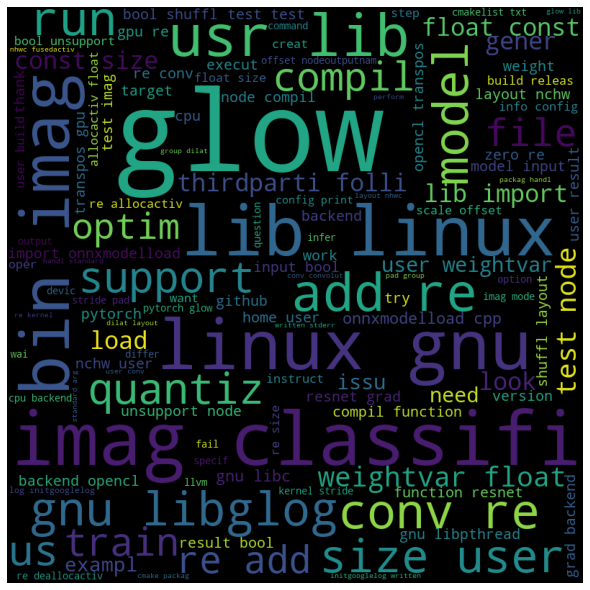

projects


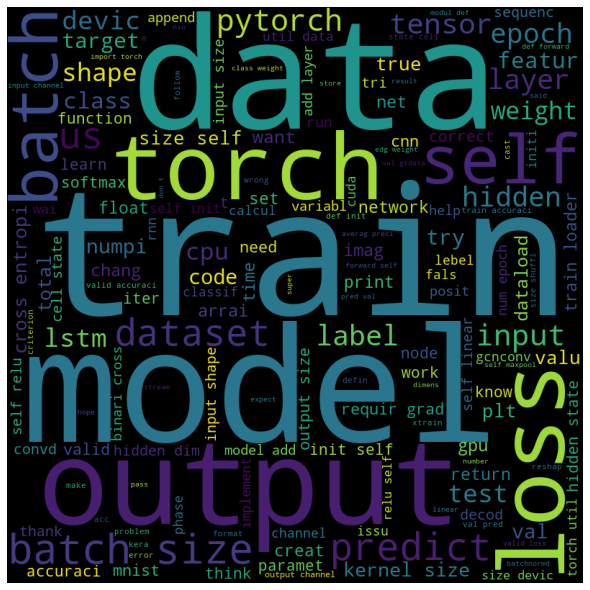

Captum


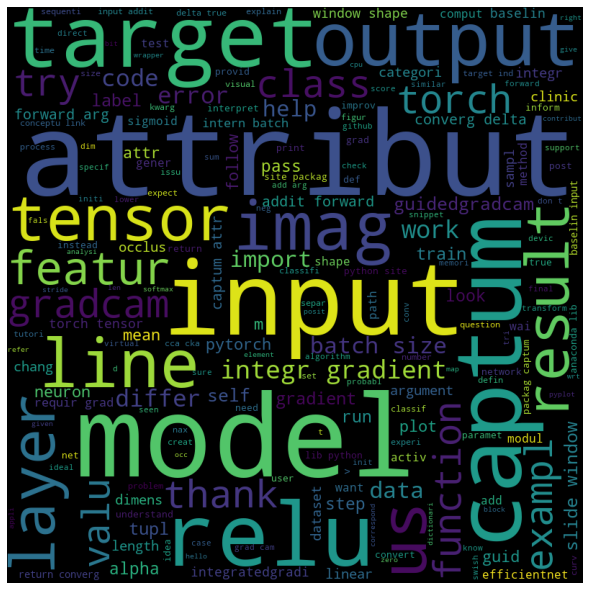

complex


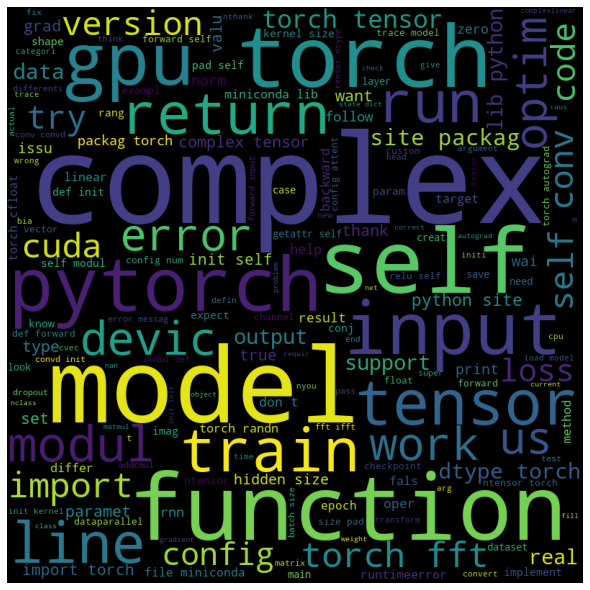

tensorboard


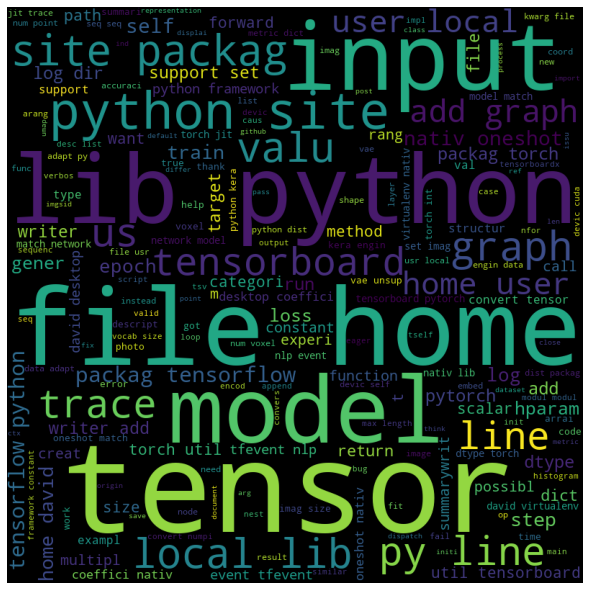

Mac OS X


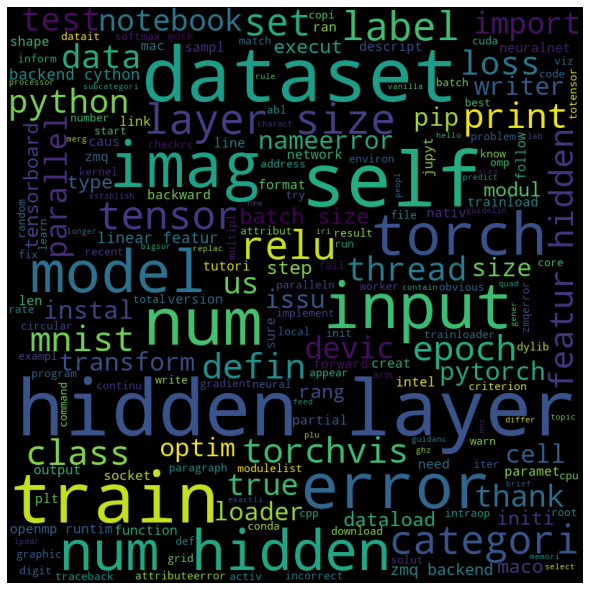

Site Feedback


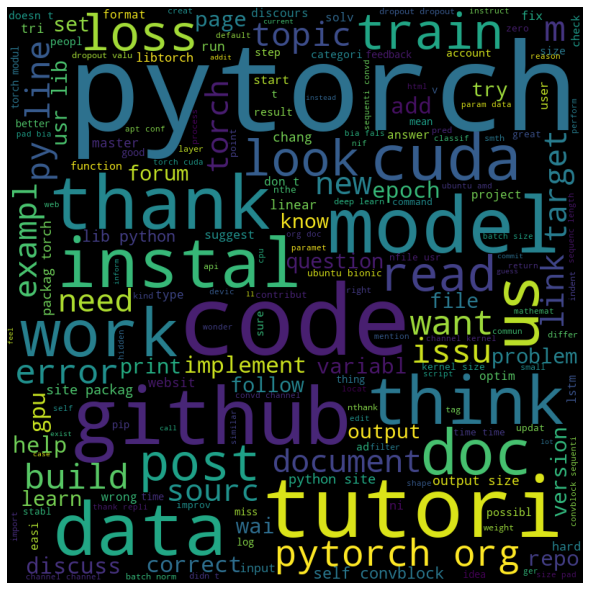

jobs


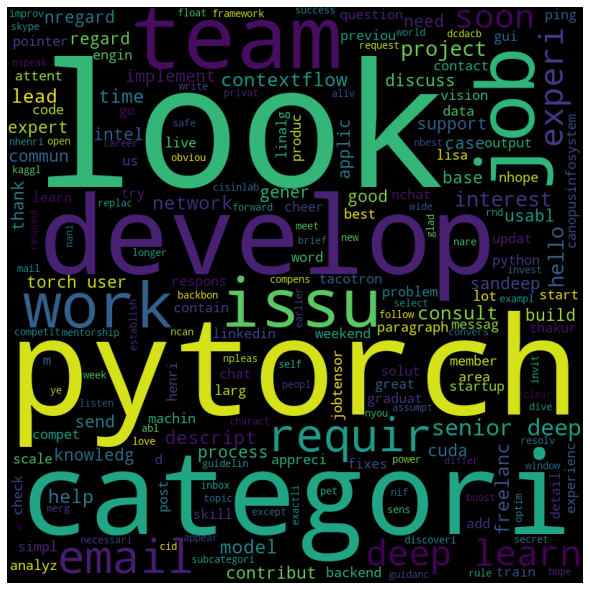

ignite


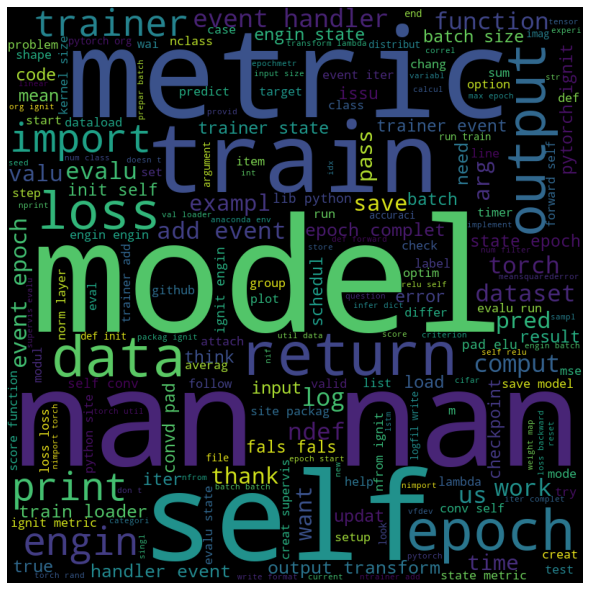

hackathon


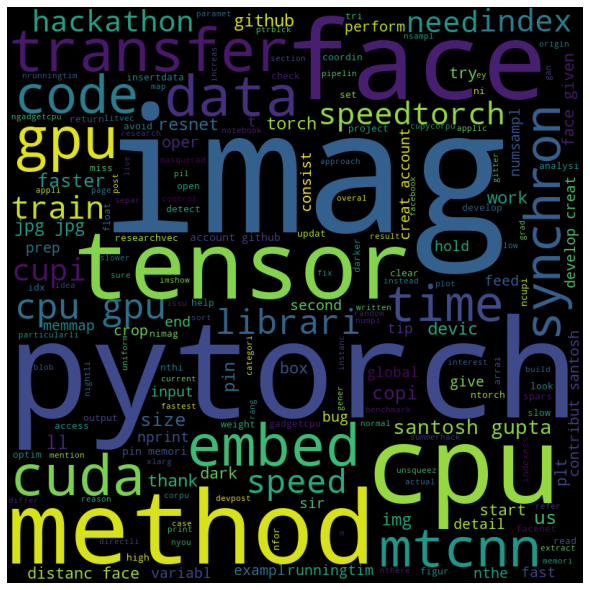

C++


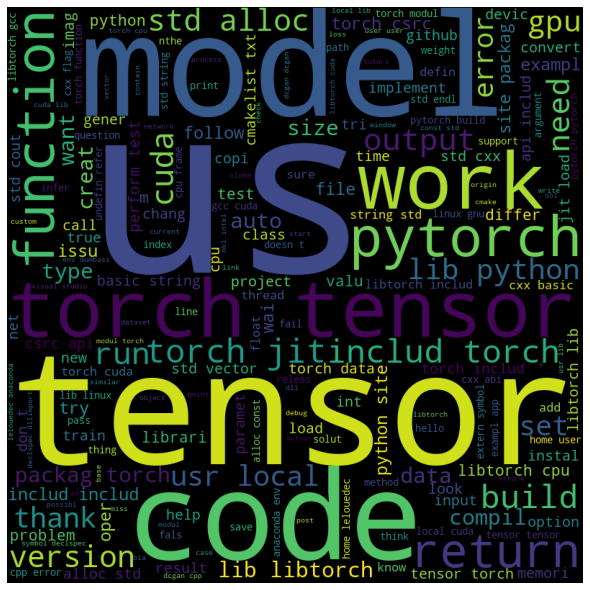

nlp


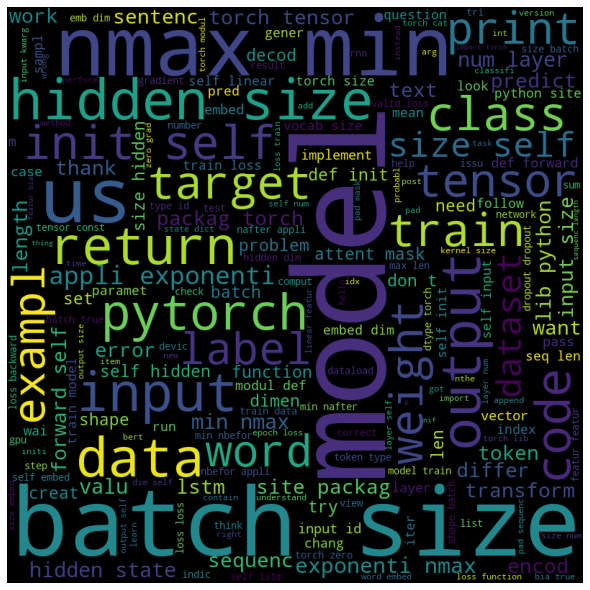

distributed


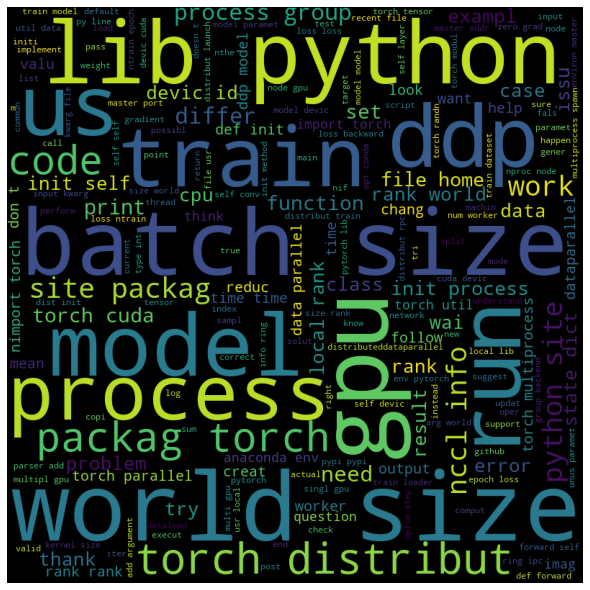

jit


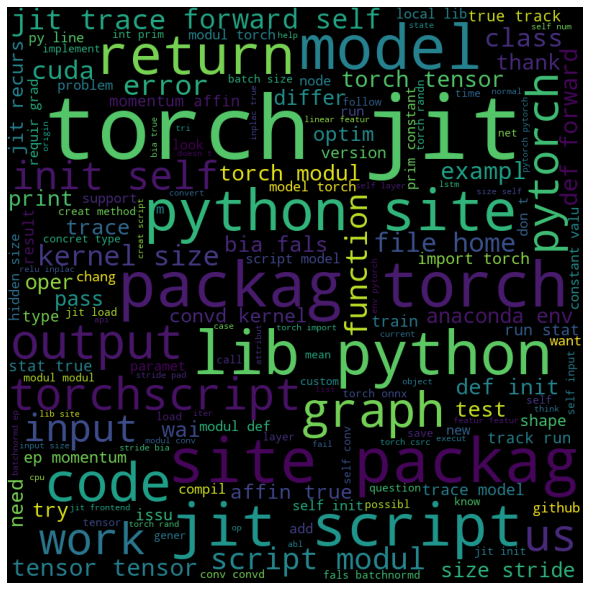

reinforcement-learning


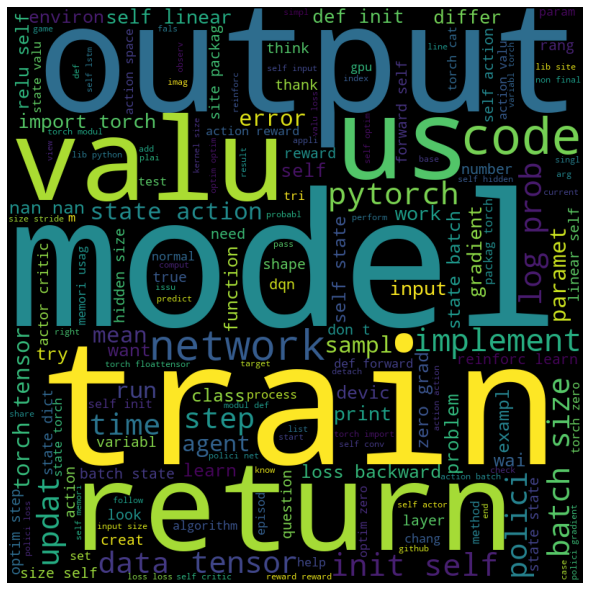

Mobile


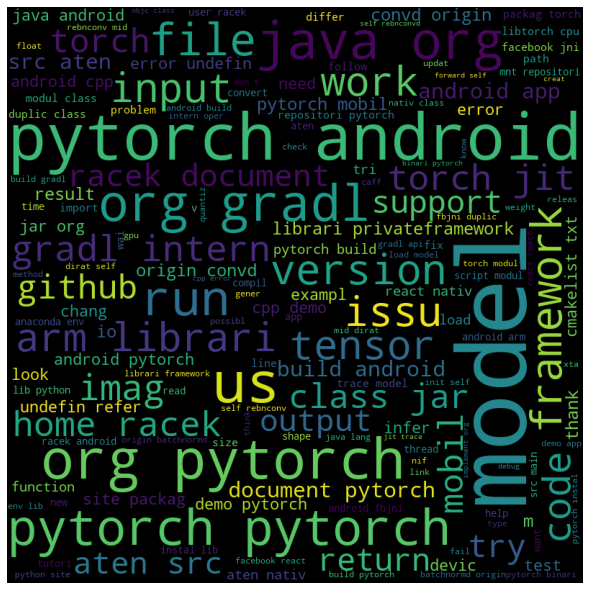

quantization


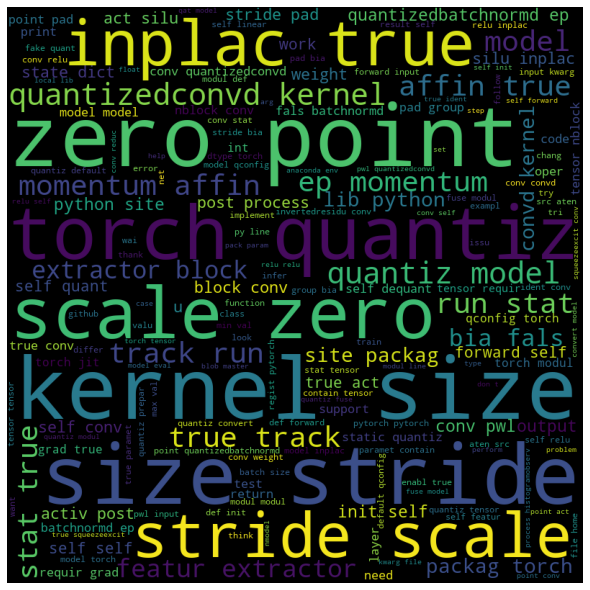

deployment


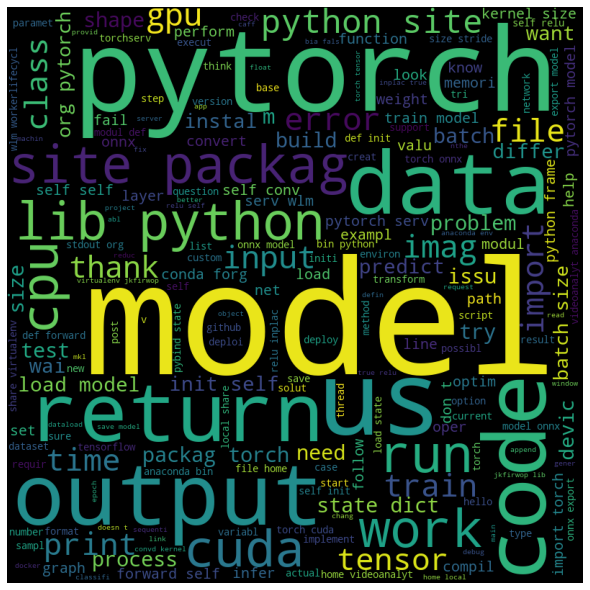

uncategorized


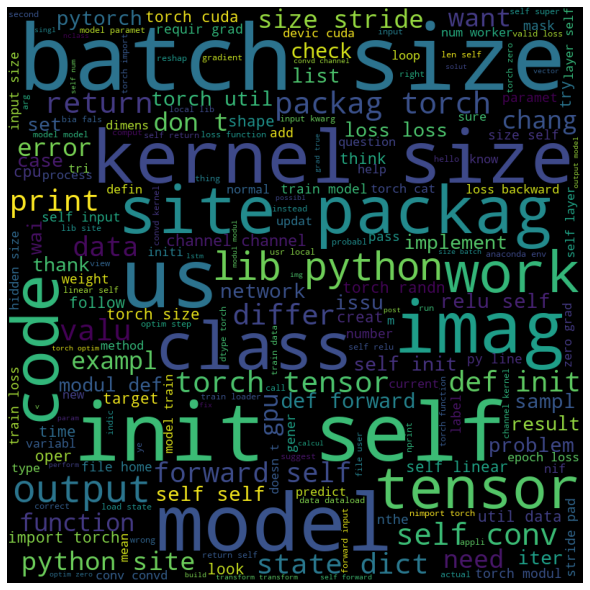

vision


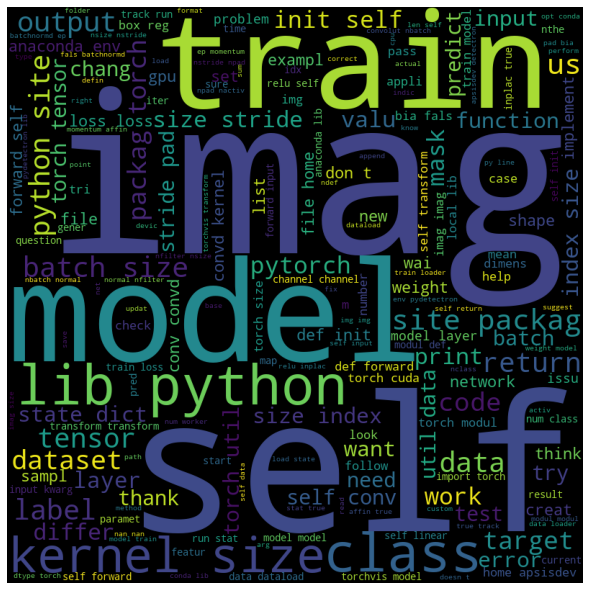

autograd


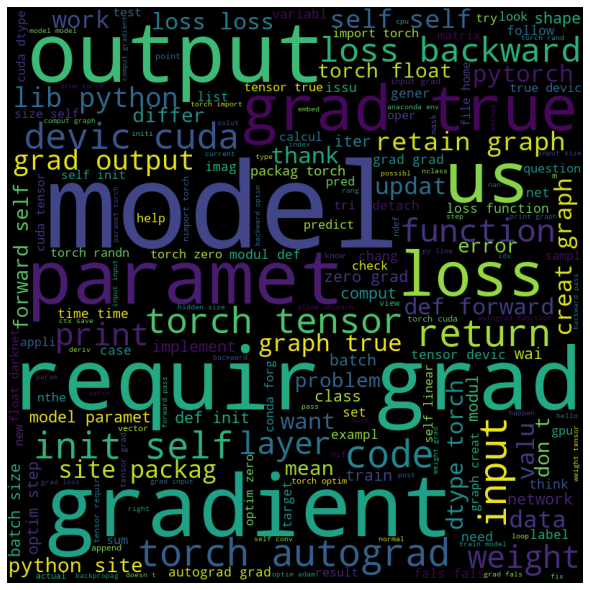

In [47]:
for i in my_list:
    print(i)
    plot_word_cloud_for_category(df_1, i)

In [92]:
import re
from nltk.corpus import stopwords
from bs4 import BeautifulSoup

REPLACE_BY_SPACE_RE = re.compile('[/(){}\[\]\'\“\”\’\|@,;]')
BAD_SYMBOLS_RE = re.compile('[^0-9a-z #+_]')
STOPWORDS = set(stopwords.words('english'))
DIGITS_RE=re.compile('\w*\d\w*')

def clean_text(text):
    text = str(text)
    text = BeautifulSoup(text, "lxml").text # HTML decoding
    text = text.lower() # lowercase text
    text = REPLACE_BY_SPACE_RE.sub(' ', text) # replace REPLACE_BY_SPACE_RE symbols by space in text
    text = text.replace(r'\n', ' ')
    text = BAD_SYMBOLS_RE.sub('', text) # delete symbols which are in BAD_SYMBOLS_RE from text
    text = ' '.join(word for word in text.split() if word not in STOPWORDS) # delete stopwors from text
    text = DIGITS_RE.sub('', text)
    return text

df_1['text']=df_1['text'].apply(clean_text)


df_2 = df_1[df_1['category'].notna()]
df_2.category.unique()

df_x = df_2['text']
df_y = df_2['category']

In [93]:
#Building the Machine Learning model & pipeline
#Converting to Doc2Vec

from gensim.models.doc2vec import TaggedDocument, Doc2Vec
from sklearn.base import BaseEstimator
from sklearn import utils as skl_utils
from tqdm import tqdm

import multiprocessing
import numpy as np

class Doc2VecTransformer(BaseEstimator):

    def __init__(self, vector_size=100, learning_rate=0.02, epochs=20):
        self.learning_rate = learning_rate
        self.epochs = epochs
        self._model = None
        self.vector_size = vector_size
        self.workers = multiprocessing.cpu_count() - 1

    def fit(self, df_x, df_y=None):
        tagged_x = [TaggedDocument(clean_text(row).split(), [index]) for index, row in enumerate(df_x)]
        model = Doc2Vec(documents=tagged_x, vector_size=self.vector_size, workers=self.workers)

        for epoch in range(self.epochs):
            model.train(skl_utils.shuffle([x for x in tqdm(tagged_x)]), total_examples=len(tagged_x), epochs=1)
            model.alpha -= self.learning_rate
            model.min_alpha = model.alpha

        self._model = model
        return self

    def transform(self, df_x):
        return np.asmatrix(np.array([self._model.infer_vector(clean_text(row).split())
                                     for index, row in enumerate(df_x)]))

In [51]:
doc2vec_trf = Doc2VecTransformer()
doc2vec_features = doc2vec_trf.fit(df_x).transform(df_x)
doc2vec_features

100%|██████████| 7060/7060 [00:00<00:00, 544484.44it/s]


matrix([[-9.8694232e-04, -3.6619455e-04, -4.6784403e-03, ...,
          2.2937923e-03,  1.6405600e-03,  3.9535062e-03],
        [-1.1597559e-03, -3.4439617e-03,  2.7014851e-04, ...,
         -9.7288878e-04, -3.1630909e-03,  3.2232178e-03],
        [-4.3760180e-03,  3.1873942e-04, -1.8169591e-03, ...,
          6.4413546e-04, -1.6820062e-03,  1.9453787e-03],
        ...,
        [ 4.4484423e-03, -1.4122048e-03, -3.3824849e-03, ...,
         -1.4234370e-03,  3.2968181e-03, -3.5774976e-04],
        [ 1.3415187e-03,  7.4350835e-05, -1.2664020e-04, ...,
          3.2097637e-04,  3.1898618e-03,  5.7912647e-04],
        [ 2.9777468e-04, -3.3687544e-03, -3.8618797e-03, ...,
         -1.3598618e-03,  9.9848094e-04, -7.5166614e-04]], dtype=float32)

In [94]:
#Pipeline with Doc2Vec & LogisticRegression=================================

from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score

pl_log_reg = Pipeline(steps=[('doc2vec',Doc2VecTransformer()),
                             ('log_reg', LogisticRegression(multi_class='multinomial', solver='saga', max_iter=100))])
scores = cross_val_score(pl_log_reg, df_x, df_y, cv=5,scoring='accuracy')
print('Accuracy for Logistic Regression: ', scores.mean())

100%|██████████| 5636/5636 [00:00<00:00, 1862813.03it/s]
C:\Users\mandy\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
100%|██████████| 5636/5636 [00:00<00:00, 1130246.11it/s]
C:\Users\mandy\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
100%|██████████| 5636/5636 [00:00<00:00, 403012.43it/s]
C:\Users\mandy\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
100%|██████████| 5636/5636 [00:00<00:00, 807594.46it/s]
C:\Users\mandy\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached w

Accuracy for Logistic Regression:  0.2847409510290987


In [95]:
#Pipeline with Doc2Vec & RandomForest=========================================

from sklearn.ensemble import RandomForestClassifier

pl_random_forest = Pipeline(steps=[('doc2vec',Doc2VecTransformer()),
                                   ('random_forest', RandomForestClassifier())])
scores = cross_val_score(pl_random_forest, df_x, df_y, cv=5,scoring='accuracy')
print('Accuracy for RandomForest : ', scores.mean())

100%|██████████| 5636/5636 [00:00<00:00, 706361.60it/s]


Accuracy for RandomForest :  0.27253371185237757


In [96]:
#Pipeline with Doc2Vec & XGBoost==============================================
import xgboost as xgb

pl_xgb = Pipeline(steps=[('doc2vec',Doc2VecTransformer()),
                         ('xgboost', xgb.XGBClassifier(objective='multi:softmax'))])
scores = cross_val_score(pl_xgb, df_x, df_y, cv=5)
print('Accuracy for XGBoost Classifier : ', scores.mean())

100%|██████████| 5636/5636 [00:00<00:00, 710010.73it/s]
C:\Users\mandy\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:22:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


100%|██████████| 5636/5636 [00:00<00:00, 1131327.94it/s]
C:\Users\mandy\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:26:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


100%|██████████| 5636/5636 [00:00<00:00, 807291.08it/s]
C:\Users\mandy\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:29:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


100%|██████████| 5636/5636 [00:00<00:00, 806107.33it/s]
C:\Users\mandy\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:36:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


100%|██████████| 5636/5636 [00:00<00:00, 940260.82it/s]
C:\Users\mandy\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:40:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy for XGBoost Classifier :  0.2702625975869411


In [97]:
#Converting to Tf-Idf========================================================

from sklearn.feature_extraction.text import TfidfVectorizer

class Text2TfIdfTransformer(BaseEstimator):

    def __init__(self):
        self._model = TfidfVectorizer()
        pass

    def fit(self, df_x, df_y=None):
        df_x = df_x.apply(lambda x : clean_text(x))
        self._model.fit(df_x)
        return self

    def transform(self, df_x):
        return self._model.transform(df_x)

In [98]:
tfidf_transformer = Text2TfIdfTransformer()
tfidf_vectors = tfidf_transformer.fit(df_x).transform(df_x)

In [99]:
tfidf_vectors.shape

(7045, 102271)

In [100]:
print(tfidf_vectors)

  (0, 89314)	0.15887214661676363
  (0, 89309)	0.25081546110605935
  (0, 82667)	0.09232664499769197
  (0, 73425)	0.12982267356479968
  (0, 69627)	0.14616206585707325
  (0, 69286)	0.11674874698214037
  (0, 68929)	0.13259878177099493
  (0, 67599)	0.21340859455698202
  (0, 67556)	0.23304888464664278
  (0, 63614)	0.0789520952688354
  (0, 62910)	0.1344832503205489
  (0, 53929)	0.13979876199898428
  (0, 48543)	0.09242712892754448
  (0, 29384)	0.16688226338083587
  (0, 27312)	0.5624941699390238
  (0, 15111)	0.14415926677693444
  (0, 14981)	0.10160276635836396
  (0, 13775)	0.23304888464664278
  (0, 12653)	0.15564981390890248
  (0, 11080)	0.40798041120331474
  (0, 4170)	0.1386409658482285
  (0, 2646)	0.20511952233011568
  (1, 99693)	0.05848213914741982
  (1, 99672)	0.1917203346066992
  (1, 99657)	0.06153973579112886
  :	:
  (7044, 33496)	0.19358125809456475
  (7044, 33199)	0.06290803623846183
  (7044, 31317)	0.08997728853148476
  (7044, 31035)	0.08073075153910753
  (7044, 30587)	0.14136198982171

In [101]:
#Pipeline with Tf-Idf & LogisticRegression==================================

pl_log_reg_tf_idf = Pipeline(steps=[('tfidf',Text2TfIdfTransformer()),
                                    ('log_reg', LogisticRegression(multi_class='multinomial', solver='saga', max_iter=100))])
scores = cross_val_score(pl_log_reg_tf_idf, df_x, df_y, cv=5,scoring='accuracy')
print('Accuracy for Tf-Idf & Logistic Regression: ', scores.mean())

Accuracy for Tf-Idf & Logistic Regression:  0.5589779985805536


In [102]:
#Pipeline with Tf-Idf & RandomForest=========================================

pl_random_forest_tf_idf = Pipeline(steps=[('tfidf',Text2TfIdfTransformer()),
                                          ('random_forest', RandomForestClassifier())])
scores = cross_val_score(pl_random_forest_tf_idf, df_x, df_y, cv=5,scoring='accuracy')
print('Accuracy for Tf-Idf & RandomForest : ', scores.mean())

Accuracy for Tf-Idf & RandomForest :  0.5419446415897801


In [103]:
#Pipeline with Tf-Idf & XGBoost================================================
pl_xgb_tf_idf = Pipeline(steps=[('tfidf',Text2TfIdfTransformer()),
                         ('xgboost', xgb.XGBClassifier(objective='multi:softmax'))])
scores = cross_val_score(pl_xgb_tf_idf, df_x, df_y, cv=5)
print('Accuracy for Tf-Idf & XGBoost Classifier : ', scores.mean())

C:\Users\mandy\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:49:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\mandy\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:51:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\mandy\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:52:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\mandy\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:54:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\mandy\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:56:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy for Tf-Idf & XGBoost Classifier :  0.6080908445706175
